In [84]:
%pip install plotly
%pip install cufflinks
%pip install chart_studio

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: plotly in c:\python311\lib\site-packages (5.22.0)




[notice] A new release of pip available: 22.3 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import cufflinks as cf
import chart_studio.plotly as py

import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

## Basics

In [86]:
arr1 = np.random.randn(50, 4)
df1 = pd.DataFrame(arr1, columns=['A', 'B', 'C', 'D'])
df1.head()

,A,B,C,D
0,1.735387,-1.767855,-2.309557,-1.321576
1,1.436580,-0.201119,-0.977553,-1.359126
2,0.671552,-0.201069,-1.634919,-0.273864
3,-0.940929,-0.416886,-0.001622,1.788828
4,-0.133339,0.100497,0.596756,-1.103802


<Axes: >

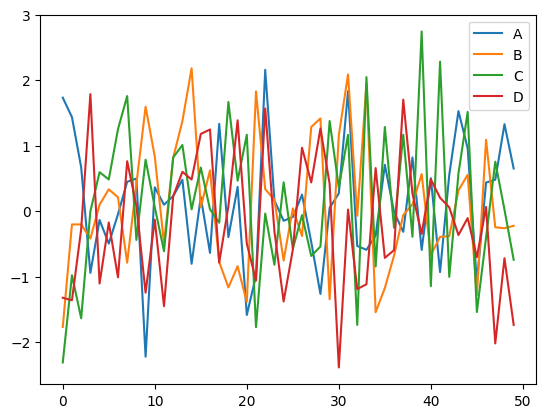

In [87]:
df1.plot()

In [88]:
df1.iplot()

## Line plot

In [89]:
import plotly.graph_objects as go
df_stocks = px.data.stocks()

#1
px.line(df_stocks, x='date', y='GOOG', labels={'x':'Date', 'y':'Price'})
#2
px.line(df_stocks, x='date', y=['GOOG', 'AAPL'], labels={'x':'Date', 'y':'Price'}, title='Apple vs Google')

#3
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=df_stocks.date,
        y=df_stocks.AAPL,
        mode='lines',
        name='Apple'
    )
)

fig.add_trace(
    go.Scatter(
        x=df_stocks.date,
        y=df_stocks.AMZN,
        mode='lines+markers',
        name='Amazon'
    )
)

fig.add_trace(
    go.Scatter(
        x=df_stocks.date,
        y=df_stocks.GOOG,
        mode='lines+markers',
        name='Google',
        line=dict(color='firebrick', width=2, dash='dashdot')
    )
)

#4
# fig.update_layout(
#     title='Stock Price Data 2018 - 2020',
#     xaxis_title = 'Price',
#     yaxis_title = 'Date',
# )

#5
fig.update_layout(
    title='Stock Price Data 2018 - 2020',
    xaxis=dict(
        showline = True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204,204,204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family = 'Arial',
            size = 12,
            color='rgb(82,82,82)',     
        )
    ),
    yaxis=dict(
        showline = False,
        showgrid=False,
        showticklabels=False,
        zeroline=False,
    ),
    autosize=False,
    margin=dict(
        autoexpand=False,
        l=100,
        r=20,
        t=110,
    ),
    showlegend = False,
    plot_bgcolor='white'           
)

## Bars Charts

In [90]:
df_us = px.data.gapminder().query("country == 'United States'")
px.bar(
    df_us,
    x='year',
    y='pop'
)


In [91]:
df_tips = px.data.tips()
px.bar(
    df_tips,
    x = 'day',
    y ='tip',
    color = 'sex',
    title = 'Tips by Sex on Each Day',
    labels={'tip': 'Tip Amount', 'day' : 'Day of the week'}
)

In [92]:
px.bar(
    df_tips,
    x = 'sex',
    y ='total_bill',
    color = 'smoker',
    barmode='group'
)

In [93]:
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2e6")
fig = px.bar(
    df_europe,
    x ='country',
    y='pop',
    text='pop',
    color='country'
)
fig

In [94]:
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2e6")
fig = px.bar(
    df_europe,
    x ='country',
    y='pop',
    text='pop',
    color='country'
)
fig.update_traces(
    texttemplate = '%{text:.2s}',
    textposition = 'outside',
)
fig.update_layout(uniformtext_minsize=8)
fig.update_layout(xaxis_tickangle=45)

fig

## Scatter Plot

In [95]:
df_iris = px.data.iris()
px.scatter(df_iris,
           x='sepal_width', 
           y='sepal_length',
           color='species',
           size='petal_length',
           hover_data=['petal_width']
           )


In [96]:
df_iris = px.data.iris()
px.scatter(df_iris,
           x='sepal_width', 
           y='sepal_length',
           color='species',
           size='petal_length',
           hover_data=['petal_width']
           )
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_iris.sepal_width,
    y=df_iris.sepal_length,
    mode='markers',
    marker_color=df_iris.sepal_width,
    text=df_iris.species,
    marker=dict(showscale=True, size = 10)
))
fig.update_traces(
    marker_line_width=1,
)

In [97]:
## scatter with massive data
fig = go.Figure(
    data = go.Scattergl(
        x = np.random.randn(100000),
        y = np.random.randn(100000),
        mode = 'markers',
        marker=dict(
            color = np.random.rand(100000),
            colorscale = 'Viridis',
            line_width=1
        )
    )
)

fig

## Plot Charts

In [98]:
df_asia = px.data.gapminder().query("year == 2007").query("continent == 'Asia'")
px.pie(
    df_asia, 
    values='pop', 
    names='country',
    title='Popu;ation of Asian Continent',
    color_discrete_sequence=px.colors.sequential.RdBu
       )

In [99]:
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown' ]
fig = go.Figure(
    data=[go.Pie(
                     labels=['Water', 'Grass', 'Normal', 'Phychic', 'Fire', 'Ground'],
                     values = [110, 90, 80, 70, 60]
              )
       ]
)
fig.update_traces(
    hoverinfo = 'label+percent',
    textfont_size=20,
    textinfo='label+percent',
    pull = [0.1, 0, 0.2, 0, 0, 0],
    marker = dict(
        colors = colors, 
        line = dict(
            color='#FFFFFF'
        )
    )
)
fig

## Histogram

In [100]:
dice1 = np.random.randint(1, 7, 5000)
dice2 = np.random.randint(1, 7, 5000)

diceSum = dice1 + dice2
fig = px.histogram(
    diceSum,
    nbins=11,
    labels={'value' : 'Dice Roll'},
    title = '5000 Dice roll Histogram',
    marginal = 'violin',
    color_discrete_sequence=['green']
)
fig.update_layout(
    xaxis_title_text = 'Dice Roll',
    yaxis_title_text = 'Dice sum',
    bargap=0.2,
    showlegend=False
)
fig

In [101]:
df_tips = px.data.tips()
px.histogram(
    df_tips,
    x = 'total_bill',
    color = 'sex',
)

## BOx plot

In [102]:
df_tips = px.data.tips()
px.box(
    df_tips,
    x ='sex',
    y = 'tip',
    points='all'
)

In [103]:
df_tips = px.data.tips()
px.box(
    df_tips,
    x ='day',
    y = 'tip',
    color='sex'
)

fig = go.Figure()
fig.add_trace(
    go.Box(
        x=df_tips.sex,
        y=df_tips.tip,
        marker_color = 'blue',
        boxmean = 'sd'
    )
)

In [104]:
df_stocks = px.data.stocks()
fig = go.Figure()
fig.add_trace(
    go.Box(
        y=df_stocks.GOOG,
        boxpoints='all',
        fillcolor='blue',
        jitter=0.5,
        whiskerwidth=0.2 
    )
)
fig.add_trace(
    go.Box(
        y=df_stocks.AAPL,
        boxpoints='all',
        fillcolor='red',
        jitter=0.5,
        whiskerwidth=0.2 
    )
)
fig.update_layout(
    title = 'Google vs. Apple',
    yaxis = dict(
        gridcolor = 'rgb(255, 255, 255)',
        gridwidth = 3,
    ),
    paper_bgcolor = 'rgb(243, 243, 243)',
    plot_bgcolor = 'rgb(243, 243, 243)'
)

## Violin Plots

In [105]:
df_tips = px.data.tips()
px.violin(
    df_tips,
    y='total_bill',
    box = True,
    points='all'
)

In [106]:
px.violin(
    df_tips,
    y='total_bill',
    box = True,
    points='all'
)

px.violin(
    df_tips,
    y='tip',
    x = 'smoker',
    color = 'sex',
    box = True,
    points='all',
    hover_data=df_tips.columns
)

In [107]:
fig = go.Figure()
fig.add_trace(
    go.Violin(
        x=df_tips['day'][df_tips['smoker'] == 'Yes'],
        y=df_tips['total_bill'][df_tips['smoker'] == 'Yes'],
        legendgroup='Yes',
        scalegroup='Yes',
        name='Yes',
        side='negative',
        line_color='blue'
    )
)
fig.add_trace(
    go.Violin(
        x=df_tips['day'][df_tips['smoker'] == 'No'],
        y=df_tips['total_bill'][df_tips['smoker'] == 'No'],
        legendgroup='Yes',
        scalegroup='Yes',
        name='No',
        side='positive',
        line_color='red'
    )
)

## Heatmap

In [108]:
flights = sns.load_dataset('flights')
flights

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121
...,...,...,...
139,1960,Aug,606
140,1960,Sep,508
141,1960,Oct,461
142,1960,Nov,390


In [109]:
fig =px.density_heatmap(
    flights,
    x='year',
    y='month',
    z='passengers',
    color_continuous_scale='Viridis',

)
fig

In [110]:
fig =px.density_heatmap(
    flights,
    x='year',
    y='month',
    z='passengers',
    marginal_x='histogram',
    marginal_y='histogram'
)
fig

## 3D scatter plot 

In [111]:
fig = px.scatter_3d(
    flights,
    x = 'year',
    y = 'month',
    z = 'passengers',
    color = 'year',
    opacity=0.9
)
fig

## 3D line plot

In [112]:
fig = px.line_3d(
    flights,
    x = 'year',
    y = 'month',
    z = 'passengers',
    color = 'year',
)
fig

## Map scatter plot

In [113]:
df = px.data.gapminder().query("year == 2007")
fig = px.scatter_geo(
    df,
    locations='iso_alpha',
    color = 'continent',
    hover_name = 'country',
    size = 'pop',
    projection = 'orthographic'
)
fig